In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import time
import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow.keras import layers, models, optimizers, regularizers
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2, preprocess_input
from sklearn.model_selection import KFold
from sklearn.metrics import (accuracy_score, precision_score, recall_score,
                              f1_score, confusion_matrix)

In [3]:
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['savefig.dpi'] = 600
plt.rcParams['figure.dpi'] = 600

In [4]:
def save_plot(filename):
    plt.savefig(f"{filename}.eps", format='eps', dpi=600, bbox_inches='tight')
    print(f"saved {filename}.eps")


In [5]:
SEED = 42
np.random.seed(SEED)
tf.random.set_seed(SEED)


In [6]:
IMG_SIZE = 224
NUM_CLASSES = 37
BATCH_SIZE = 32


In [7]:
# Head-only training (cached bottleneck features) is cheap -> can afford a
# full, meaningful epoch budget for every exploratory experiment.
EPOCHS_HEAD = 10

In [8]:
# True end-to-end fine-tuning (unfrozen base) is expensive -> kept short and
# used sparingly (only where the manual specifically requires it).
EPOCHS_FT = 5


In [9]:
# If you have a GPU, flip this to True to run a genuine 5-fold CV on the
# fine-tuning configs in Section 13 / Section 16 instead of the single-split
# evaluation used by default for CPU-friendly runtime.
FULL_CV_FOR_FINETUNE = False

In [10]:
(raw_train, raw_test), ds_info = tfds.load(
    "oxford_iiit_pet",
    split=["train", "test"],
    as_supervised=True,
    with_info=True,
)

print("classes:", ds_info.features["label"].num_classes)
print("train examples:", ds_info.splits["train"].num_examples)
print("test examples:", ds_info.splits["test"].num_examples)

classes: 37
train examples: 3680
test examples: 3669


In [11]:
def preprocess(image, label):
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    image = preprocess_input(image)
    return image, label


def make_dataset(ds, shuffle=False, batch_size=BATCH_SIZE):
    ds = ds.map(preprocess, num_parallel_calls=tf.data.AUTOTUNE)
    if shuffle:
        ds = ds.shuffle(1000, seed=SEED)
    ds = ds.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return ds


n_train_total = ds_info.splits["train"].num_examples
n_val = int(0.2 * n_train_total)

full_train = raw_train.shuffle(2000, seed=SEED)
val_raw = full_train.take(n_val)
train_raw = full_train.skip(n_val)

train_ds = make_dataset(train_raw, shuffle=True)
val_ds = make_dataset(val_raw, shuffle=False)
test_ds = make_dataset(raw_test, shuffle=False)

print("train batches:", tf.data.experimental.cardinality(train_ds).numpy())
print("val batches  :", tf.data.experimental.cardinality(val_ds).numpy())
print("test batches :", tf.data.experimental.cardinality(test_ds).numpy())


train batches: 92
val batches  : 23
test batches : 115


In [12]:
def build_feature_extractor():
    base = MobileNetV2(input_shape=(IMG_SIZE, IMG_SIZE, 3),
                        include_top=False, weights="imagenet", pooling="avg")
    base.trainable = False
    return base


feature_extractor = build_feature_extractor()

depthwise_layers = [l.name for l in feature_extractor.layers if "depthwise" in l.name]
pointwise_layers = [l.name for l in feature_extractor.layers
                     if isinstance(l, layers.Conv2D) and l.kernel_size == (1, 1)]
add_layers = [l.name for l in feature_extractor.layers if isinstance(l, layers.Add)]
bn_layers = [l.name for l in feature_extractor.layers if isinstance(l, layers.BatchNormalization)]
relu6_layers = [l.name for l in feature_extractor.layers
                if isinstance(l, layers.ReLU) and l.max_value == 6]

print("Total layers in MobileNetV2 base:", len(feature_extractor.layers))
print("Depthwise conv layers:", len(depthwise_layers), "e.g.", depthwise_layers[:3])
print("Pointwise (1x1) conv layers:", len(pointwise_layers), "e.g.", pointwise_layers[:3])
print("Residual 'Add' layers (inverted residual blocks):", len(add_layers))
print("BatchNormalization layers:", len(bn_layers))
print("ReLU6 activation layers:", len(relu6_layers))

# Inference: MobileNetV2 alternates depthwise and pointwise (1x1) convolutions
# instead of one large standard convolution, and adds skip connections
# (Add layers) between "linear bottleneck" blocks whenever input/output
# shapes match, i.e. the inverted residual blocks described in Section 4.

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
Total layers in MobileNetV2 base: 155
Depthwise conv layers: 51 e.g. ['expanded_conv_depthwise', 'expanded_conv_depthwise_BN', 'expanded_conv_depthwise_relu']
Pointwise (1x1) conv layers: 34 e.g. ['expanded_conv_project', 'block_1_expand', 'block_1_project']
Residual 'Add' layers (inverted residual blocks): 10
BatchNormalization layers: 52
ReLU6 activation layers: 35


In [13]:
def extract_features(ds, extractor=feature_extractor):
    feats, labels = [], []
    for img_batch, lbl_batch in ds:
        f = extractor(img_batch, training=False).numpy()
        feats.append(f)
        labels.append(lbl_batch.numpy())
    return np.concatenate(feats, axis=0), np.concatenate(labels, axis=0)


t0 = time.time()
train_feat, train_lbl = extract_features(train_ds)
val_feat, val_lbl = extract_features(val_ds)
test_feat, test_lbl = extract_features(test_ds)
print(f"Bottleneck feature extraction done in {time.time() - t0:.1f}s")
print("train_feat:", train_feat.shape, " val_feat:", val_feat.shape, " test_feat:", test_feat.shape)

FEATURE_DIM = train_feat.shape[1]

# "complete training data" for final retraining steps (Sections 12/13/16)
full_train_feat = np.concatenate([train_feat, val_feat], axis=0)
full_train_lbl = np.concatenate([train_lbl, val_lbl], axis=0)

Bottleneck feature extraction done in 162.4s
train_feat: (2944, 1280)  val_feat: (736, 1280)  test_feat: (3669, 1280)


In [14]:
def build_head(kernel_initializer="he_normal", l2_reg=0.0, dropout_rate=0.0,
               use_batchnorm=True, input_dim=FEATURE_DIM):
    reg = regularizers.l2(l2_reg) if l2_reg > 0 else None
    inputs = layers.Input(shape=(input_dim,))
    x = inputs
    if use_batchnorm:
        x = layers.BatchNormalization()(x)
    if dropout_rate > 0:
        x = layers.Dropout(dropout_rate)(x)
    outputs = layers.Dense(NUM_CLASSES, activation="softmax",
                            kernel_initializer=kernel_initializer,
                            kernel_regularizer=reg)(x)
    return models.Model(inputs, outputs)


def make_optimizer(name, lr):
    if name == "SGD":
        return optimizers.SGD(learning_rate=lr)
    if name == "Momentum":
        return optimizers.SGD(learning_rate=lr, momentum=0.9)
    if name == "RMSProp":
        return optimizers.RMSprop(learning_rate=lr)
    if name == "Adam":
        return optimizers.Adam(learning_rate=lr)
    raise ValueError(f"Unknown optimizer name: {name}")


def train_head(build_kwargs, X_tr, y_tr, X_va, y_va, optimizer_name="Adam", lr=1e-3,
               epochs=EPOCHS_HEAD, batch_size=BATCH_SIZE, verbose=0):
    model = build_head(**build_kwargs)
    model.compile(optimizer=make_optimizer(optimizer_name, lr),
                  loss="sparse_categorical_crossentropy", metrics=["accuracy"])
    start = time.time()
    history = model.fit(X_tr, y_tr, validation_data=(X_va, y_va),
                         epochs=epochs, batch_size=batch_size, verbose=verbose)
    elapsed = time.time() - start
    return model, history, elapsed

In [15]:
init_strategies = {
    "Zero": "zeros",
    "Random": "random_normal",
    "Xavier/Glorot": "glorot_uniform",
    "He": "he_normal",
}

init_histories = {}
for name, init_name in init_strategies.items():
    print(f"--- Training with {name} initialization ---")
    _, history, _ = train_head(dict(kernel_initializer=init_name, use_batchnorm=False),
                                train_feat, train_lbl, val_feat, val_lbl)
    init_histories[name] = history.history

--- Training with Zero initialization ---


--- Training with Random initialization ---
--- Training with Xavier/Glorot initialization ---
--- Training with He initialization ---


saved plot1_init_training_loss.eps


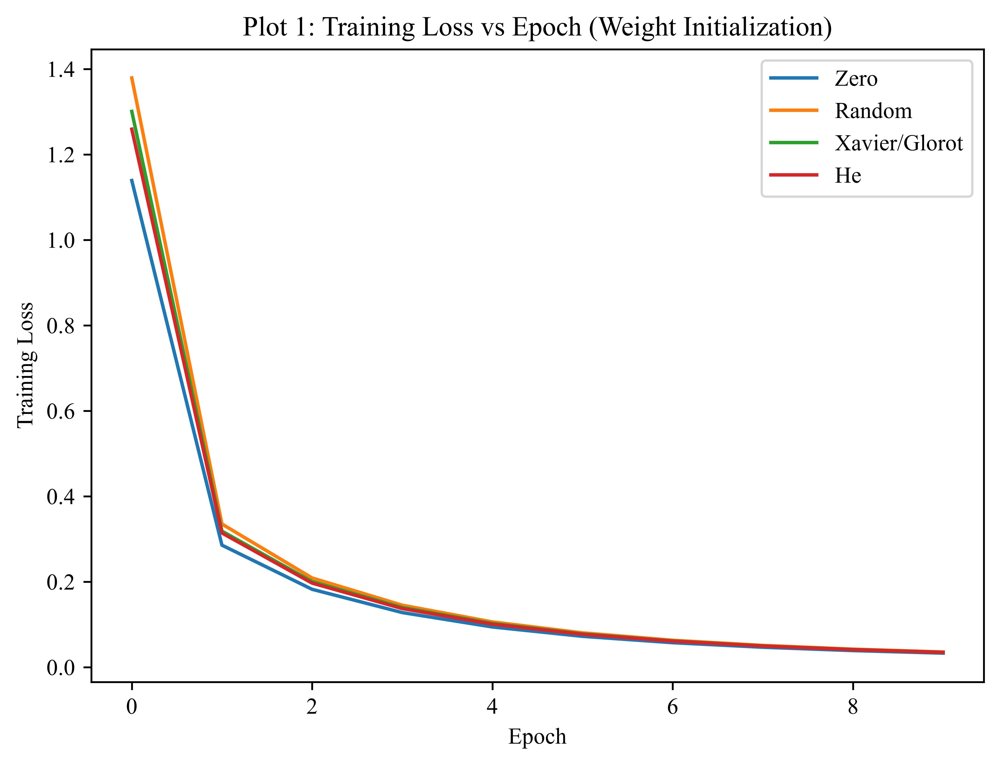

In [16]:
# Plot 1: Training Loss vs Epoch (per initialization)
plt.figure(figsize=(7, 5))
for name, hist in init_histories.items():
    plt.plot(hist["loss"], label=name)
plt.xlabel("Epoch")
plt.ylabel("Training Loss")
plt.title("Plot 1: Training Loss vs Epoch (Weight Initialization)")
plt.legend()
save_plot("plot1_init_training_loss")
plt.show()

# Inference: [Fill in after running] He/Xavier are expected to converge
# faster and more smoothly than Zero/Random init. NOTE: since only the
# classifier head is trainable here (the pretrained base is frozen), the
# classic "zero-init symmetry breaking" failure of deep from-scratch
# networks is muted - with a single trainable Dense layer, per-class
# gradients still differ even from an all-zero start, so Zero init here
# mainly shows a slower start rather than a complete training failure.

saved plot2_init_val_accuracy.eps


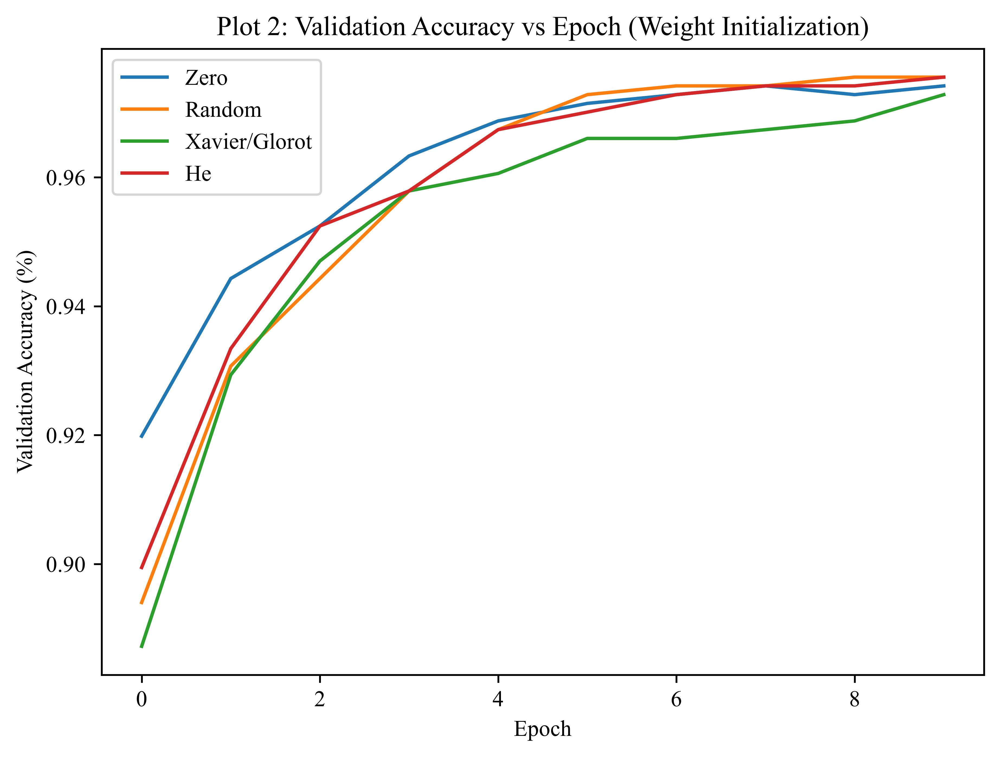

In [17]:
# Plot 2: Validation Accuracy vs Epoch (per initialization)
plt.figure(figsize=(7, 5))
for name, hist in init_histories.items():
    plt.plot(hist["val_accuracy"], label=name)
plt.xlabel("Epoch")
plt.ylabel("Validation Accuracy (%)")
plt.title("Plot 2: Validation Accuracy vs Epoch (Weight Initialization)")
plt.legend()
save_plot("plot2_init_val_accuracy")
plt.show()

# Inference: [Fill in after running] Identify which curve rises fastest and
# plateaus highest -> that is the most stable initialization for this setup.



In [19]:
reg_configs = {
    "No Regularization": dict(l2_reg=0.0, dropout_rate=0.0, use_batchnorm=False),
    "L2 Regularization": dict(l2_reg=1e-3, dropout_rate=0.0, use_batchnorm=False),
    "Dropout": dict(l2_reg=0.0, dropout_rate=0.5, use_batchnorm=False),
    "Batch Normalization": dict(l2_reg=0.0, dropout_rate=0.0, use_batchnorm=True),
}

reg_histories = {}
for name, cfg in reg_configs.items():
    print(f"--- Training with {name} ---")
    _, history, _ = train_head(dict(kernel_initializer="he_normal", **cfg),
                                train_feat, train_lbl, val_feat, val_lbl)
    reg_histories[name] = history.history

--- Training with No Regularization ---
--- Training with L2 Regularization ---
--- Training with Dropout ---
--- Training with Batch Normalization ---


saved plot3_regularization_accuracy.eps


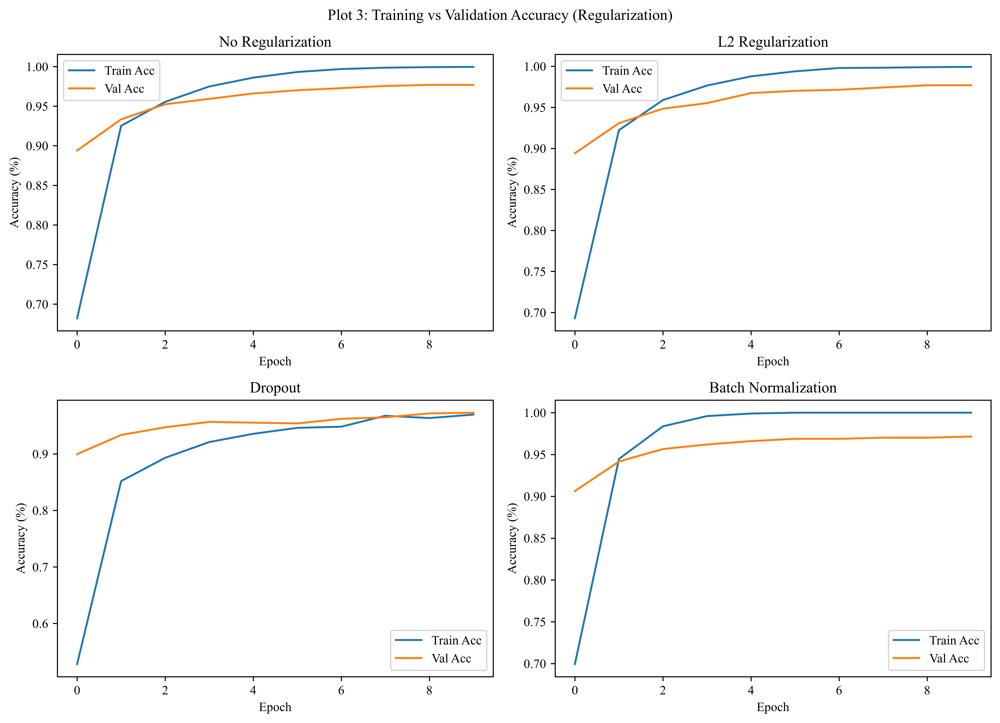

In [20]:
# Plot 3: Training and Validation Accuracy vs Epoch
fig, axes = plt.subplots(2, 2, figsize=(11, 8))
for ax, (name, hist) in zip(axes.ravel(), reg_histories.items()):
    ax.plot(hist["accuracy"], label="Train Acc")
    ax.plot(hist["val_accuracy"], label="Val Acc")
    ax.set_title(name)
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Accuracy (%)")
    ax.legend()
plt.suptitle("Plot 3: Training vs Validation Accuracy (Regularization)")
plt.tight_layout()
save_plot("plot3_regularization_accuracy")
plt.show()

# Inference: [Fill in after running] The gap between train and val accuracy
# is the "generalization gap" - larger gap = more overfitting.


saved plot4_regularization_loss.eps


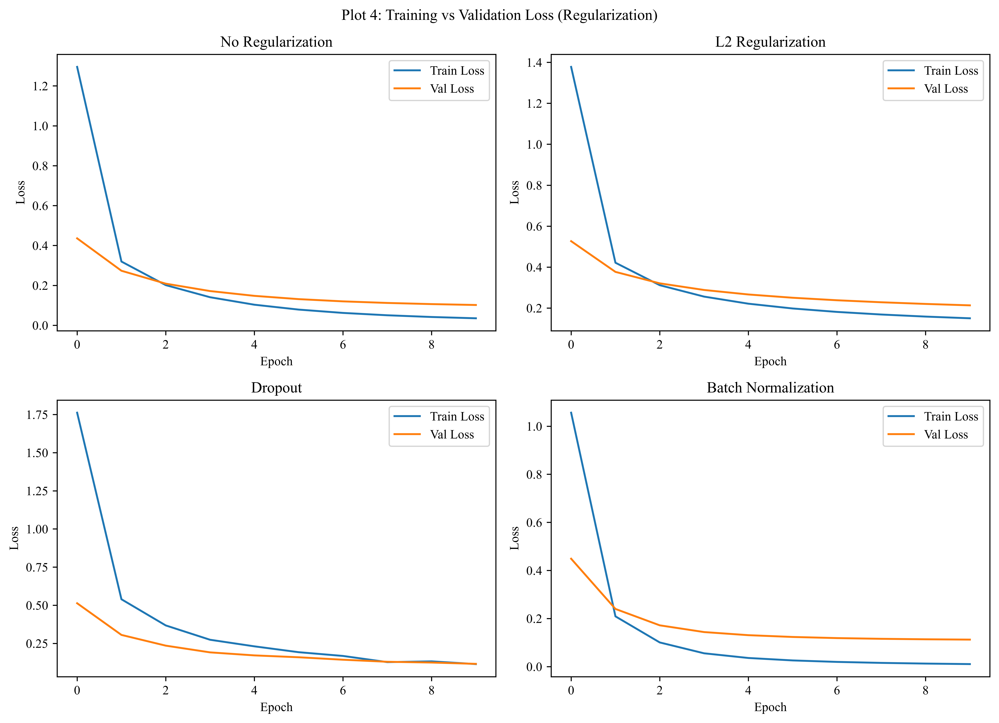

In [21]:
# Plot 4: Training and Validation Loss vs Epoch
fig, axes = plt.subplots(2, 2, figsize=(11, 8))
for ax, (name, hist) in zip(axes.ravel(), reg_histories.items()):
    ax.plot(hist["loss"], label="Train Loss")
    ax.plot(hist["val_loss"], label="Val Loss")
    ax.set_title(name)
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Loss")
    ax.legend()
plt.suptitle("Plot 4: Training vs Validation Loss (Regularization)")
plt.tight_layout()
save_plot("plot4_regularization_loss")
plt.show()

# Inference: [Fill in after running] Check whether validation loss starts
# increasing while training loss keeps decreasing - that marks the onset of
# overfitting.

In [22]:
x = np.array([2, 4, 6, 8], dtype=float)
mu_B = x.mean()
var_B = ((x - mu_B) ** 2).mean()
eps = 1e-8
x_hat = (x - mu_B) / np.sqrt(var_B + eps)

print("mean       :", mu_B)
print("variance   :", var_B)
print("normalized :", np.round(x_hat, 3))

gamma, beta = 1.0, 0.0
y_out = gamma * x_hat + beta
print("output (gamma=1, beta=0):", np.round(y_out, 3))

# Inference: Batch Normalization rescales the mini-batch to approximately
# zero mean and unit variance; gamma and beta then let the network
# shift/scale this normalized distribution as needed.

mean       : 5.0
variance   : 5.0
normalized : [-1.342 -0.447  0.447  1.342]
output (gamma=1, beta=0): [-1.342 -0.447  0.447  1.342]


saved plot5_batchnorm_comparison.eps


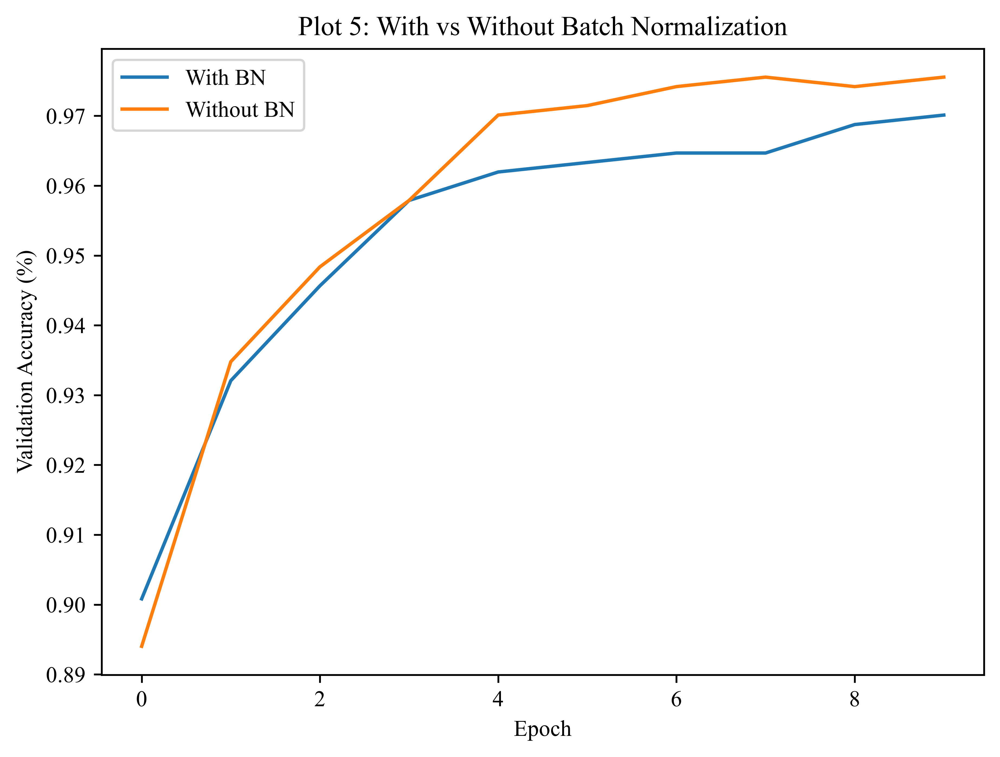

In [23]:
# Plot 5: With vs Without Batch Normalization
_, hist_bn_on, _ = train_head(dict(kernel_initializer="he_normal", use_batchnorm=True),
                               train_feat, train_lbl, val_feat, val_lbl)
_, hist_bn_off, _ = train_head(dict(kernel_initializer="he_normal", use_batchnorm=False),
                                train_feat, train_lbl, val_feat, val_lbl)

plt.figure(figsize=(7, 5))
plt.plot(hist_bn_on.history["val_accuracy"], label="With BN")
plt.plot(hist_bn_off.history["val_accuracy"], label="Without BN")
plt.xlabel("Epoch")
plt.ylabel("Validation Accuracy (%)")
plt.title("Plot 5: With vs Without Batch Normalization")
plt.legend()
save_plot("plot5_batchnorm_comparison")
plt.show()

# Inference: [Fill in after running] BN usually gives faster, more stable
# convergence because it normalizes the scale of the incoming features.

In [24]:
optimizer_names = ["SGD", "Momentum", "RMSProp", "Adam"]
opt_histories = {}
opt_summary_rows = []

for name in optimizer_names:
    print(f"--- Training with {name} optimizer ---")
    _, history, elapsed = train_head(dict(kernel_initializer="he_normal", use_batchnorm=True),
                                      train_feat, train_lbl, val_feat, val_lbl,
                                      optimizer_name=name, lr=1e-3)
    opt_histories[name] = history.history
    best_val_acc = max(history.history["val_accuracy"])
    epoch_to_converge = int(np.argmax(history.history["val_accuracy"])) + 1
    opt_summary_rows.append({
        "Optimizer": name,
        "Final Loss": round(history.history["loss"][-1], 4),
        "Best Val. Accuracy": round(best_val_acc, 4),
        "Epoch to Converge": epoch_to_converge,
        "Time (s)": round(elapsed, 3),
    })

--- Training with SGD optimizer ---
--- Training with Momentum optimizer ---
--- Training with RMSProp optimizer ---
--- Training with Adam optimizer ---


saved plot6_optimizer_training_loss.eps


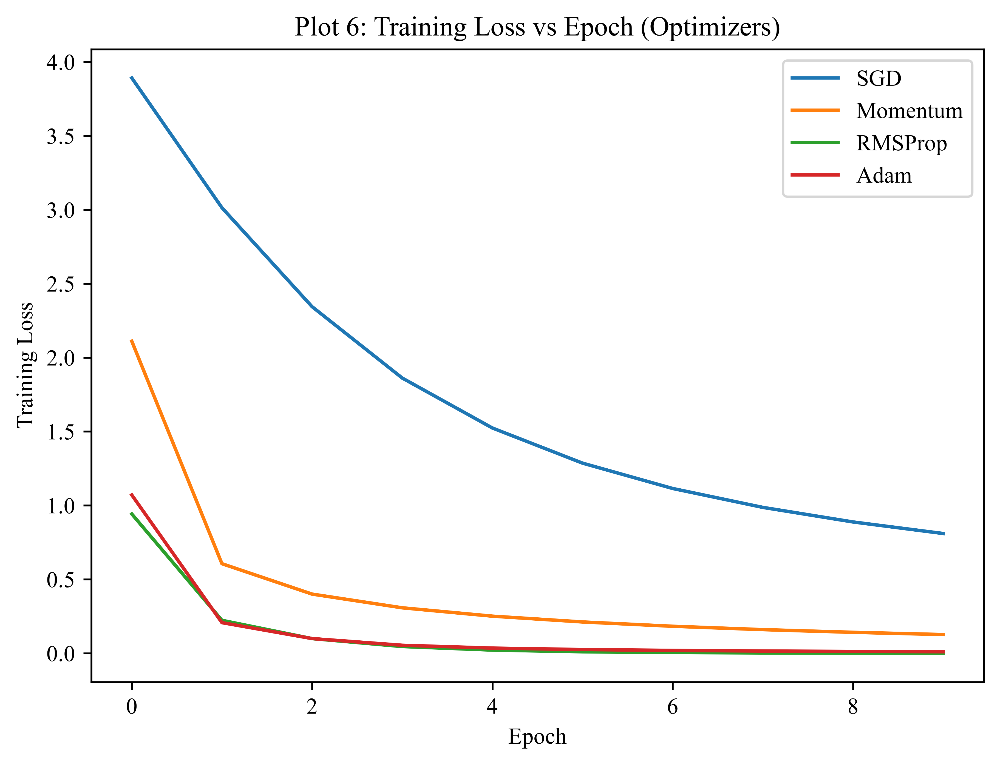

In [25]:
# Plot 6: Training Loss vs Epoch for Different Optimizers
plt.figure(figsize=(7, 5))
for name, hist in opt_histories.items():
    plt.plot(hist["loss"], label=name)
plt.xlabel("Epoch")
plt.ylabel("Training Loss")
plt.title("Plot 6: Training Loss vs Epoch (Optimizers)")
plt.legend()
save_plot("plot6_optimizer_training_loss")
plt.show()

saved plot7_optimizer_val_accuracy.eps


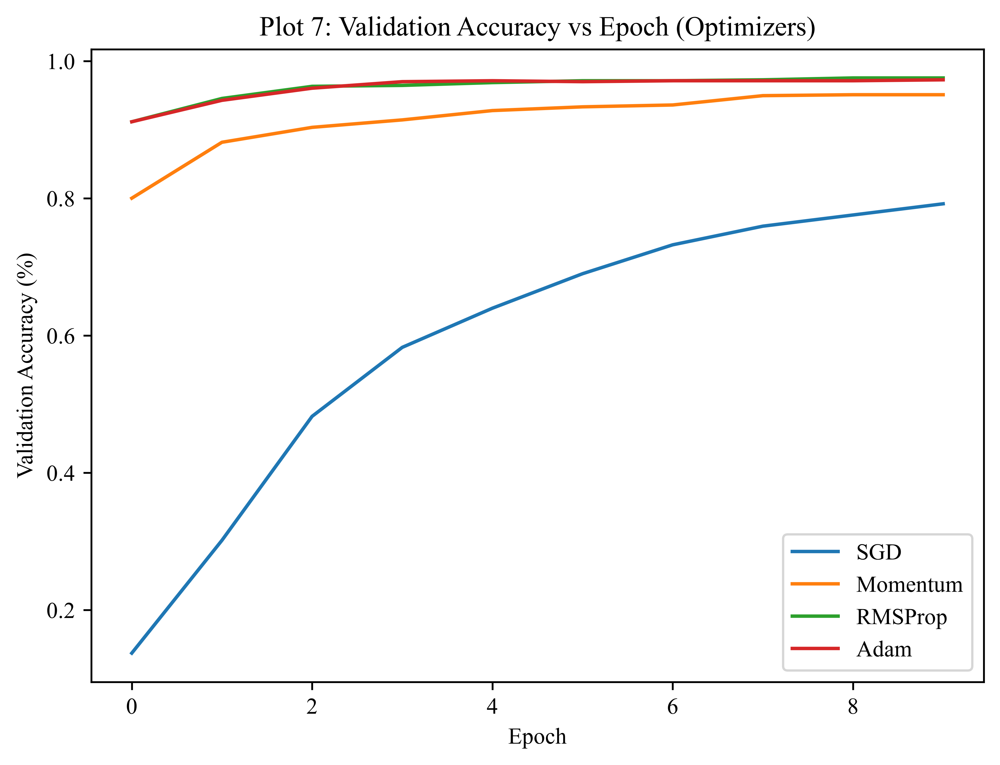

  Optimizer  Final Loss  Best Val. Accuracy  Epoch to Converge  Time (s)
0       SGD      0.8100              0.7921                 10     2.007
1  Momentum      0.1266              0.9511                  9     2.133
2   RMSProp      0.0009              0.9755                  9     2.208
3      Adam      0.0103              0.9728                 10     2.607


In [26]:
# Plot 7: Validation Accuracy vs Epoch for Different Optimizers
plt.figure(figsize=(7, 5))
for name, hist in opt_histories.items():
    plt.plot(hist["val_accuracy"], label=name)
plt.xlabel("Epoch")
plt.ylabel("Validation Accuracy (%)")
plt.title("Plot 7: Validation Accuracy vs Epoch (Optimizers)")
plt.legend()
save_plot("plot7_optimizer_val_accuracy")
plt.show()

opt_summary_df = pd.DataFrame(opt_summary_rows)
print(opt_summary_df)

# Inference: [Fill in after running] Adam / RMSProp usually converge fastest
# due to adaptive per-parameter learning rates; plain SGD is slower; Momentum
# sits in between.

In [27]:
def conv_output_size(N, K, P, S):
    return (N + 2 * P - K) // S + 1


for (N, K, P, S) in [(224, 3, 1, 1), (224, 3, 1, 2), (112, 3, 0, 1), (7, 3, 1, 2)]:
    O = conv_output_size(N, K, P, S)
    print(f"N={N}, K={K}, P={P}, S={S}  ->  O={O}")

# Inference: with padding=1 and stride=1 the spatial size is preserved
# (same-padding behaviour); stride 2 roughly halves the output size, which
# is how MobileNetV2 downsamples feature maps between stages.

N=224, K=3, P=1, S=1  ->  O=224
N=224, K=3, P=1, S=2  ->  O=112
N=112, K=3, P=0, S=1  ->  O=110
N=7, K=3, P=1, S=2  ->  O=4


In [28]:
def run_single_head_config(dropout_rate=0.0, batch_size=BATCH_SIZE, lr=1e-3, epochs=EPOCHS_HEAD):
    _, history, _ = train_head(dict(kernel_initializer="he_normal", use_batchnorm=True,
                                     dropout_rate=dropout_rate),
                                train_feat, train_lbl, val_feat, val_lbl,
                                lr=lr, batch_size=batch_size, epochs=epochs)
    return max(history.history["val_accuracy"])


saved plot8_learning_rate.eps


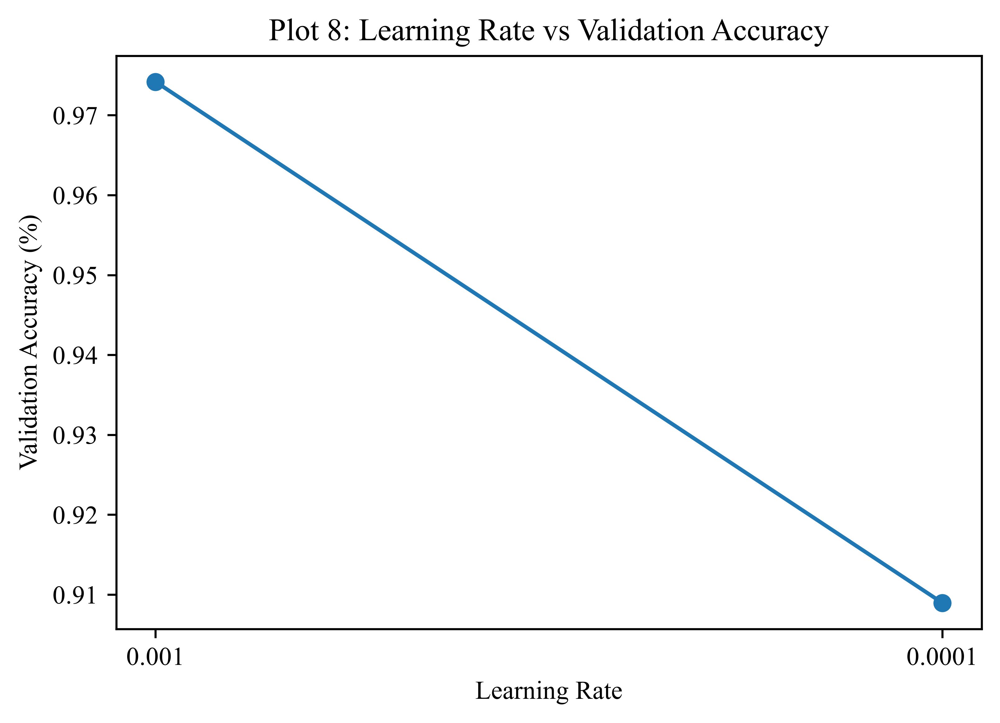

In [29]:
# Plot 8: Learning Rate vs Validation Accuracy
learning_rates = [1e-3, 1e-4]
lr_val_acc = [run_single_head_config(lr=lr) for lr in learning_rates]

plt.figure(figsize=(6, 4))
plt.plot([str(lr) for lr in learning_rates], lr_val_acc, marker="o")
plt.xlabel("Learning Rate")
plt.ylabel("Validation Accuracy (%)")
plt.title("Plot 8: Learning Rate vs Validation Accuracy")
save_plot("plot8_learning_rate")
plt.show()

# Inference: [Fill in after running] A larger LR moves faster within the
# fixed epoch budget; a smaller LR is more stable but may need more epochs.


saved plot9_batch_size.eps


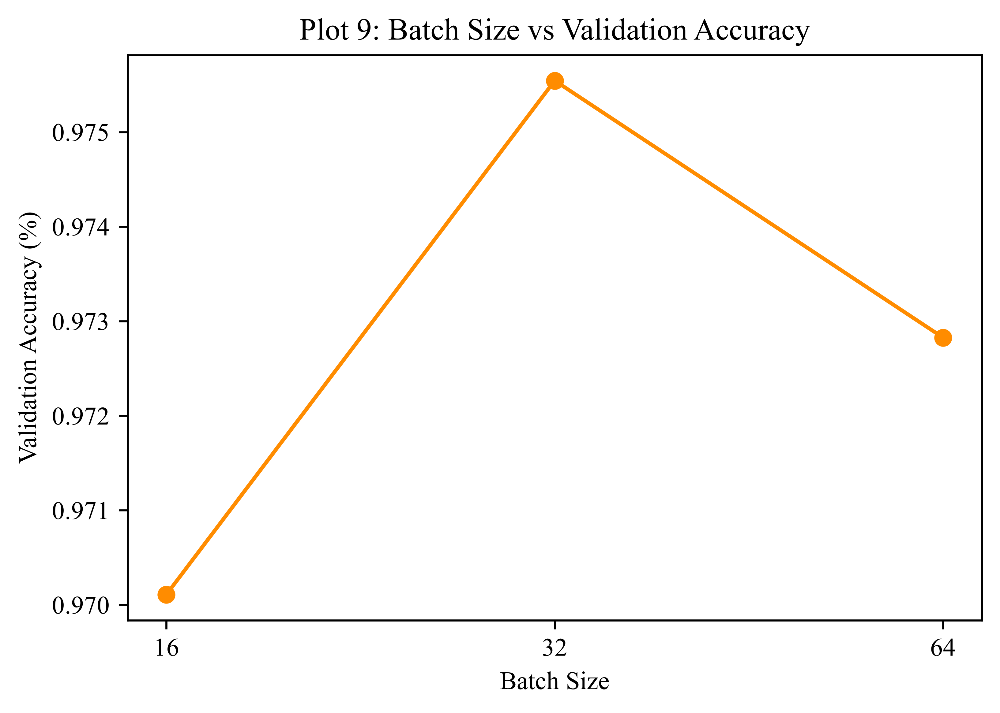

In [30]:
# Plot 9: Batch Size vs Validation Accuracy
batch_sizes = [16, 32, 64]
bs_val_acc = [run_single_head_config(batch_size=bs) for bs in batch_sizes]

plt.figure(figsize=(6, 4))
plt.plot([str(bs) for bs in batch_sizes], bs_val_acc, marker="o", color="darkorange")
plt.xlabel("Batch Size")
plt.ylabel("Validation Accuracy (%)")
plt.title("Plot 9: Batch Size vs Validation Accuracy")
save_plot("plot9_batch_size")
plt.show()

# Inference: [Fill in after running] Larger batches give smoother gradient
# estimates but, with a fixed learning rate, can under-update the weights
# within the same epoch budget.

saved plot10_dropout_rate.eps


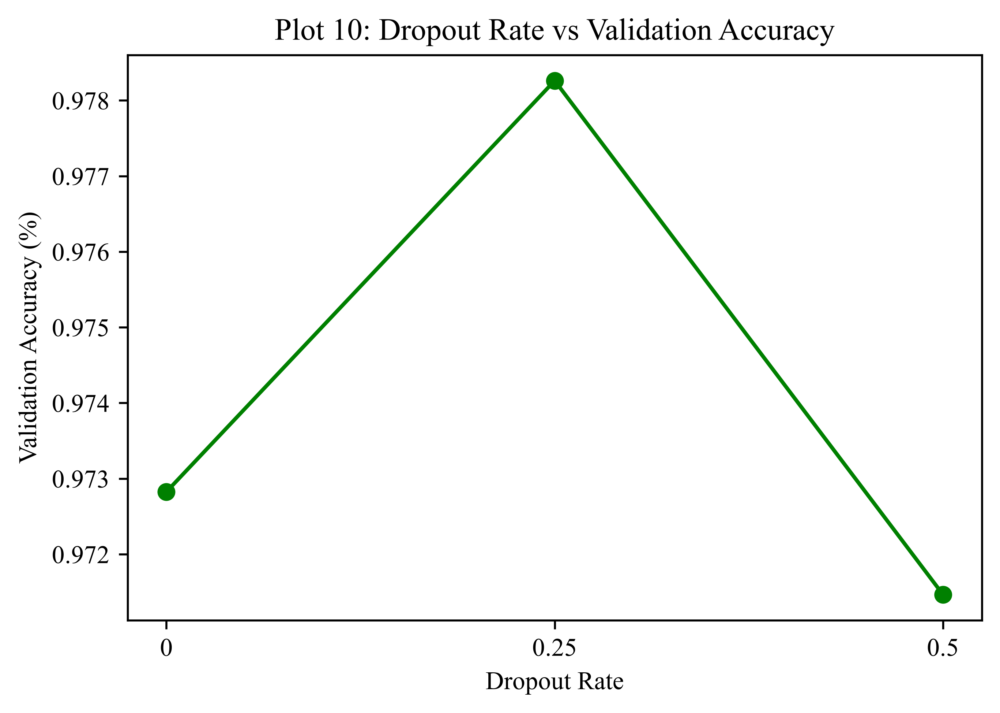

In [31]:
# Plot 10: Dropout Rate vs Validation Accuracy
dropout_rates = [0, 0.25, 0.5]
do_val_acc = [run_single_head_config(dropout_rate=dr) for dr in dropout_rates]

plt.figure(figsize=(6, 4))
plt.plot([str(dr) for dr in dropout_rates], do_val_acc, marker="o", color="green")
plt.xlabel("Dropout Rate")
plt.ylabel("Validation Accuracy (%)")
plt.title("Plot 10: Dropout Rate vs Validation Accuracy")
save_plot("plot10_dropout_rate")
plt.show()

# Inference: [Fill in after running] Dropout = 0 risks overfitting; a
# moderate rate usually balances regularization and capacity; too high a
# rate can underfit a head this small.

In [32]:
def build_full_model(kernel_initializer="he_normal", l2_reg=0.0, dropout_rate=0.0,
                      use_batchnorm=True, trainable_base=False, fine_tune_at=None):
    base_model = MobileNetV2(input_shape=(IMG_SIZE, IMG_SIZE, 3),
                              include_top=False, weights="imagenet", pooling="avg")
    base_model.trainable = trainable_base
    if trainable_base and fine_tune_at is not None:
        for layer in base_model.layers[:fine_tune_at]:
            layer.trainable = False

    reg = regularizers.l2(l2_reg) if l2_reg > 0 else None
    x = base_model.output
    if use_batchnorm:
        x = layers.BatchNormalization()(x)
    if dropout_rate > 0:
        x = layers.Dropout(dropout_rate)(x)
    outputs = layers.Dense(NUM_CLASSES, activation="softmax",
                            kernel_initializer=kernel_initializer,
                            kernel_regularizer=reg)(x)
    return models.Model(base_model.input, outputs)


def train_full(model, optimizer, tr_ds, va_ds, epochs=EPOCHS_FT, verbose=1):
    model.compile(optimizer=optimizer, loss="sparse_categorical_crossentropy",
                   metrics=["accuracy"])
    start = time.time()
    history = model.fit(tr_ds, validation_data=va_ds, epochs=epochs, verbose=verbose)
    elapsed = time.time() - start
    return history, elapsed


def evaluate_full_on_test(model, ds=test_ds):
    yt, yp = [], []
    for img_batch, lbl_batch in ds:
        preds = model.predict(img_batch, verbose=0)
        yp.extend(np.argmax(preds, axis=1))
        yt.extend(lbl_batch.numpy())
    return accuracy_score(np.array(yt), np.array(yp)), np.array(yt), np.array(yp)



In [33]:
# Case A: Feature Extraction (frozen base) -> cached-feature head training
_, hist_fe, _ = train_head(dict(kernel_initializer="he_normal", use_batchnorm=True,
                                 dropout_rate=0.3),
                            train_feat, train_lbl, val_feat, val_lbl)

# Case B: Fine-Tuning (unfreeze top of the base, small LR) -> real end-to-end
model_ft = build_full_model(kernel_initializer="he_normal", use_batchnorm=True,
                             dropout_rate=0.3, trainable_base=True, fine_tune_at=100)
hist_ft, _ = train_full(model_ft, optimizers.Adam(learning_rate=1e-5), train_ds, val_ds)


Epoch 1/5


c:\Users\Kishore\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\epoch_iterator.py:74: UserWarning: `shuffle=True` was passed, but will be ignored since the data `x` was provided as a tf.data.Dataset. The Dataset is expected to already be shuffled (via `.shuffle(buffer_size)`).
  self.data_adapter = data_adapters.get_data_adapter(


92/92 ━━━━━━━━━━━━━━━━━━━━ 62s 588ms/step - accuracy: 0.0703 - loss: 4.2818 - val_accuracy: 0.1848 - val_loss: 3.0792
Epoch 2/5
92/92 ━━━━━━━━━━━━━━━━━━━━ 54s 583ms/step - accuracy: 0.2099 - loss: 3.0935 - val_accuracy: 0.4171 - val_loss: 2.2790
Epoch 3/5
92/92 ━━━━━━━━━━━━━━━━━━━━ 54s 575ms/step - accuracy: 0.3889 - loss: 2.2591 - val_accuracy: 0.6209 - val_loss: 1.5452
Epoch 4/5
92/92 ━━━━━━━━━━━━━━━━━━━━ 53s 574ms/step - accuracy: 0.5387 - loss: 1.6836 - val_accuracy: 0.7188 - val_loss: 1.1162
Epoch 5/5
92/92 ━━━━━━━━━━━━━━━━━━━━ 54s 583ms/step - accuracy: 0.6386 - loss: 1.3158 - val_accuracy: 0.7663 - val_loss: 0.8541


Epoch 1/5
92/92 ━━━━━━━━━━━━━━━━━━━━ 62s 590ms/step - accuracy: 0.5041 - loss: 1.9299 - val_accuracy: 0.8370 - val_loss: 0.6097
Epoch 2/5
92/92 ━━━━━━━━━━━━━━━━━━━━ 54s 582ms/step - accuracy: 0.8719 - loss: 0.4375 - val_accuracy: 0.9226 - val_loss: 0.2796
Epoch 3/5
92/92 ━━━━━━━━━━━━━━━━━━━━ 54s 581ms/step - accuracy: 0.9327 - loss: 0.2243 - val_accuracy: 0.9429 - val_loss: 0.1803
Epoch 4/5
92/92 ━━━━━━━━━━━━━━━━━━━━ 54s 578ms/step - accuracy: 0.9582 - loss: 0.1525 - val_accuracy: 0.9810 - val_loss: 0.0789
Epoch 5/5
92/92 ━━━━━━━━━━━━━━━━━━━━ 53s 574ms/step - accuracy: 0.9793 - loss: 0.0902 - val_accuracy: 0.9878 - val_loss: 0.0626


saved finetune_lr_comparison.eps


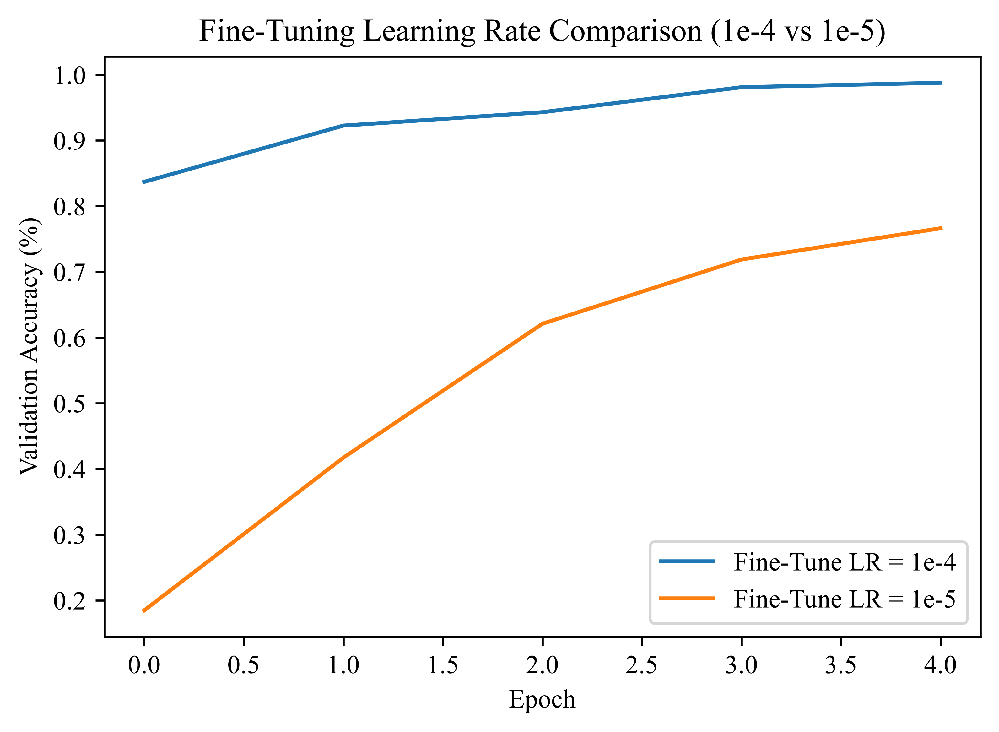

In [34]:
# Fine-tuning LR comparison (1e-4 vs 1e-5), both real end-to-end runs
model_ft_lr4 = build_full_model(kernel_initializer="he_normal", use_batchnorm=True,
                                 dropout_rate=0.3, trainable_base=True, fine_tune_at=100)
hist_ft_lr4, _ = train_full(model_ft_lr4, optimizers.Adam(learning_rate=1e-4), train_ds, val_ds)

plt.figure(figsize=(6, 4))
plt.plot(hist_ft_lr4.history["val_accuracy"], label="Fine-Tune LR = 1e-4")
plt.plot(hist_ft.history["val_accuracy"], label="Fine-Tune LR = 1e-5")
plt.xlabel("Epoch")
plt.ylabel("Validation Accuracy (%)")
plt.title("Fine-Tuning Learning Rate Comparison (1e-4 vs 1e-5)")
plt.legend()
save_plot("finetune_lr_comparison")
plt.show()

# Inference: [Fill in after running] 1e-4 updates the unfrozen layers more
# aggressively (risk of destabilizing pretrained features); 1e-5 is gentler
# and usually safer but may need more epochs to show a clear benefit.


saved plot11_feature_extraction_vs_finetuning.eps


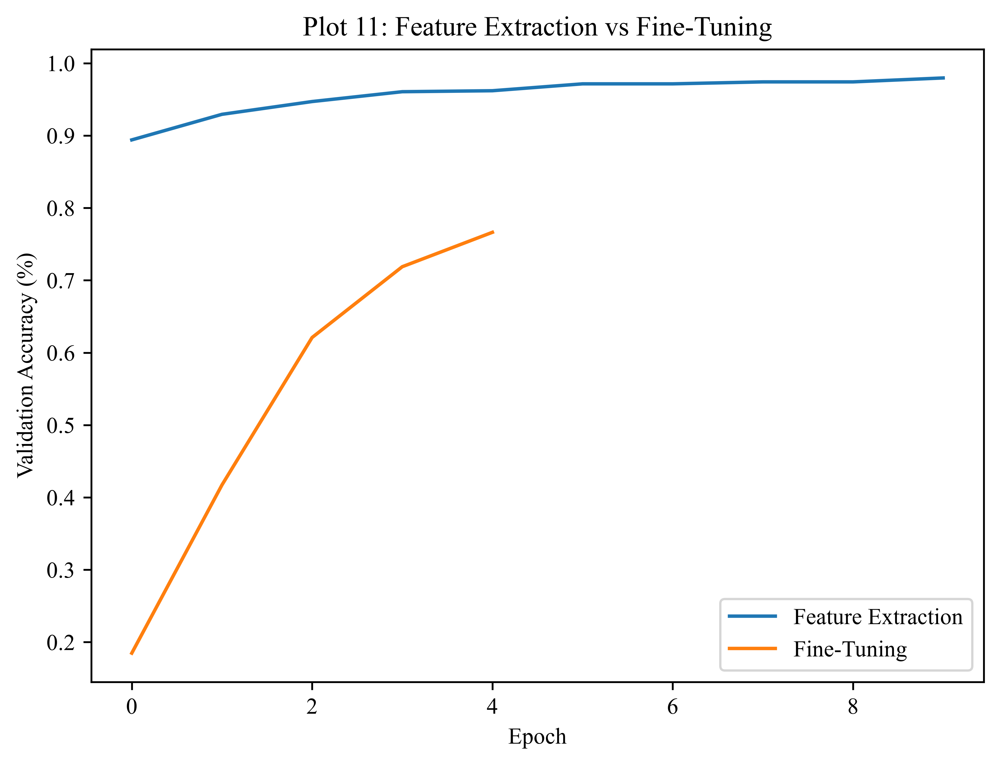

In [35]:
# Plot 11: Feature Extraction vs Fine-Tuning
plt.figure(figsize=(7, 5))
plt.plot(hist_fe.history["val_accuracy"], label="Feature Extraction")
plt.plot(hist_ft.history["val_accuracy"], label="Fine-Tuning")
plt.xlabel("Epoch")
plt.ylabel("Validation Accuracy (%)")
plt.title("Plot 11: Feature Extraction vs Fine-Tuning")
plt.legend()
save_plot("plot11_feature_extraction_vs_finetuning")
plt.show()

# Inference: [Fill in after running] Fine-tuning usually starts near
# feature-extraction accuracy and can pull ahead as the unfrozen layers
# adapt to pet-breed-specific patterns.

saved plot12_finetuning_loss.eps


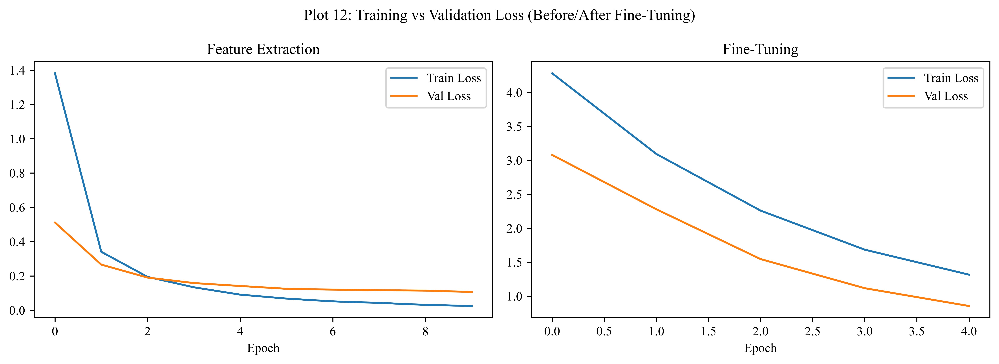

In [36]:
# Plot 12: Training and Validation Loss (before vs after fine-tuning)
fig, axes = plt.subplots(1, 2, figsize=(11, 4))
axes[0].plot(hist_fe.history["loss"], label="Train Loss")
axes[0].plot(hist_fe.history["val_loss"], label="Val Loss")
axes[0].set_title("Feature Extraction")
axes[0].set_xlabel("Epoch")
axes[0].legend()

axes[1].plot(hist_ft.history["loss"], label="Train Loss")
axes[1].plot(hist_ft.history["val_loss"], label="Val Loss")
axes[1].set_title("Fine-Tuning")
axes[1].set_xlabel("Epoch")
axes[1].legend()

plt.suptitle("Plot 12: Training vs Validation Loss (Before/After Fine-Tuning)")
plt.tight_layout()
save_plot("plot12_finetuning_loss")
plt.show()

# Inference: [Fill in after running] A widening train/val loss gap in the
# fine-tuning panel would signal that unfreezing introduced overfitting.

# Discussion: fine-tuning uses a much smaller learning rate than a fresh
# classifier because the pretrained weights are already close to a good
# solution - large updates here would destroy useful ImageNet features
# (catastrophic forgetting).

In [37]:
K = 5
kf = KFold(n_splits=K, shuffle=True, random_state=SEED)


def run_kfold_cv_head(name, build_kwargs, optimizer_name="Adam", opt_lr=1e-3,
                       epochs=EPOCHS_HEAD, batch_size=BATCH_SIZE):
    accs = []
    start = time.time()
    for fold_idx, (tr_idx, va_idx) in enumerate(kf.split(train_feat), start=1):
        X_tr, X_va = train_feat[tr_idx], train_feat[va_idx]
        y_tr, y_va = train_lbl[tr_idx], train_lbl[va_idx]
        _, history, _ = train_head(build_kwargs, X_tr, y_tr, X_va, y_va,
                                    optimizer_name=optimizer_name, lr=opt_lr,
                                    epochs=epochs, batch_size=batch_size)
        fold_acc = max(history.history["val_accuracy"])
        accs.append(fold_acc)
        print(f"  [{name}] Fold {fold_idx}: val_accuracy = {fold_acc:.4f}")
    return accs, time.time() - start


def retrain_head_full_and_evaluate(build_kwargs, optimizer_name="Adam", opt_lr=1e-3,
                                    epochs=EPOCHS_HEAD, batch_size=BATCH_SIZE):
    """Retrains on the COMPLETE training data (train+val combined) and
    evaluates once on the untouched test set."""
    model, history, elapsed = train_head(build_kwargs, full_train_feat, full_train_lbl,
                                          test_feat, test_lbl,  # for monitoring only
                                          optimizer_name=optimizer_name, lr=opt_lr,
                                          epochs=epochs, batch_size=batch_size)
    test_preds = np.argmax(model.predict(test_feat, verbose=0), axis=1)
    test_acc = accuracy_score(test_lbl, test_preds)
    return model, history, elapsed, test_acc

In [38]:
candidate_configs = {
    "C1_Baseline": dict(build_kwargs=dict(kernel_initializer="he_normal", use_batchnorm=False,
                                           dropout_rate=0.0, l2_reg=0.0),
                         optimizer_name="Adam", opt_lr=1e-3),
    "C2_BestInit_BN": dict(build_kwargs=dict(kernel_initializer="he_normal", use_batchnorm=True,
                                              dropout_rate=0.0, l2_reg=0.0),
                            optimizer_name="Adam", opt_lr=1e-3),
    "C3_BN_Dropout": dict(build_kwargs=dict(kernel_initializer="he_normal", use_batchnorm=True,
                                             dropout_rate=0.3, l2_reg=0.0),
                           optimizer_name="Adam", opt_lr=1e-3),
    "C4_BN_Dropout_L2": dict(build_kwargs=dict(kernel_initializer="he_normal", use_batchnorm=True,
                                                dropout_rate=0.3, l2_reg=1e-4),
                              optimizer_name="Adam", opt_lr=1e-3),
}

cv_results = {}
for name, cfg in candidate_configs.items():
    print(f"=== Cross-validating {name} ===")
    accs, _ = run_kfold_cv_head(name, cfg["build_kwargs"], cfg["optimizer_name"], cfg["opt_lr"])
    cv_results[name] = accs

=== Cross-validating C1_Baseline ===
  [C1_Baseline] Fold 1: val_accuracy = 0.8947
  [C1_Baseline] Fold 2: val_accuracy = 0.9015
  [C1_Baseline] Fold 3: val_accuracy = 0.9219
  [C1_Baseline] Fold 4: val_accuracy = 0.9253
  [C1_Baseline] Fold 5: val_accuracy = 0.9133
=== Cross-validating C2_BestInit_BN ===
  [C2_BestInit_BN] Fold 1: val_accuracy = 0.8913
  [C2_BestInit_BN] Fold 2: val_accuracy = 0.8998
  [C2_BestInit_BN] Fold 3: val_accuracy = 0.9151
  [C2_BestInit_BN] Fold 4: val_accuracy = 0.9032
  [C2_BestInit_BN] Fold 5: val_accuracy = 0.8929
=== Cross-validating C3_BN_Dropout ===
  [C3_BN_Dropout] Fold 1: val_accuracy = 0.8896
  [C3_BN_Dropout] Fold 2: val_accuracy = 0.8998
  [C3_BN_Dropout] Fold 3: val_accuracy = 0.9287
  [C3_BN_Dropout] Fold 4: val_accuracy = 0.9168
  [C3_BN_Dropout] Fold 5: val_accuracy = 0.9031
=== Cross-validating C4_BN_Dropout_L2 ===
  [C4_BN_Dropout_L2] Fold 1: val_accuracy = 0.9083
  [C4_BN_Dropout_L2] Fold 2: val_accuracy = 0.9049
  [C4_BN_Dropout_L2] Fold

In [39]:
cv_table_rows = []
for name, accs in cv_results.items():
    row = {"Configuration": name}
    for i, a in enumerate(accs, start=1):
        row[f"F{i}"] = round(a, 4)
    row["Mean"] = round(np.mean(accs), 4)
    row["SD"] = round(np.std(accs), 4)
    cv_table_rows.append(row)

cv_df = pd.DataFrame(cv_table_rows)
print(cv_df)

      Configuration      F1      F2      F3      F4      F5    Mean      SD
0       C1_Baseline  0.8947  0.9015  0.9219  0.9253  0.9133  0.9113  0.0117
1    C2_BestInit_BN  0.8913  0.8998  0.9151  0.9032  0.8929  0.9005  0.0085
2     C3_BN_Dropout  0.8896  0.8998  0.9287  0.9168  0.9031  0.9076  0.0137
3  C4_BN_Dropout_L2  0.9083  0.9049  0.9134  0.9185  0.9031  0.9096  0.0057


saved plot13_kfold_cv_accuracy.eps


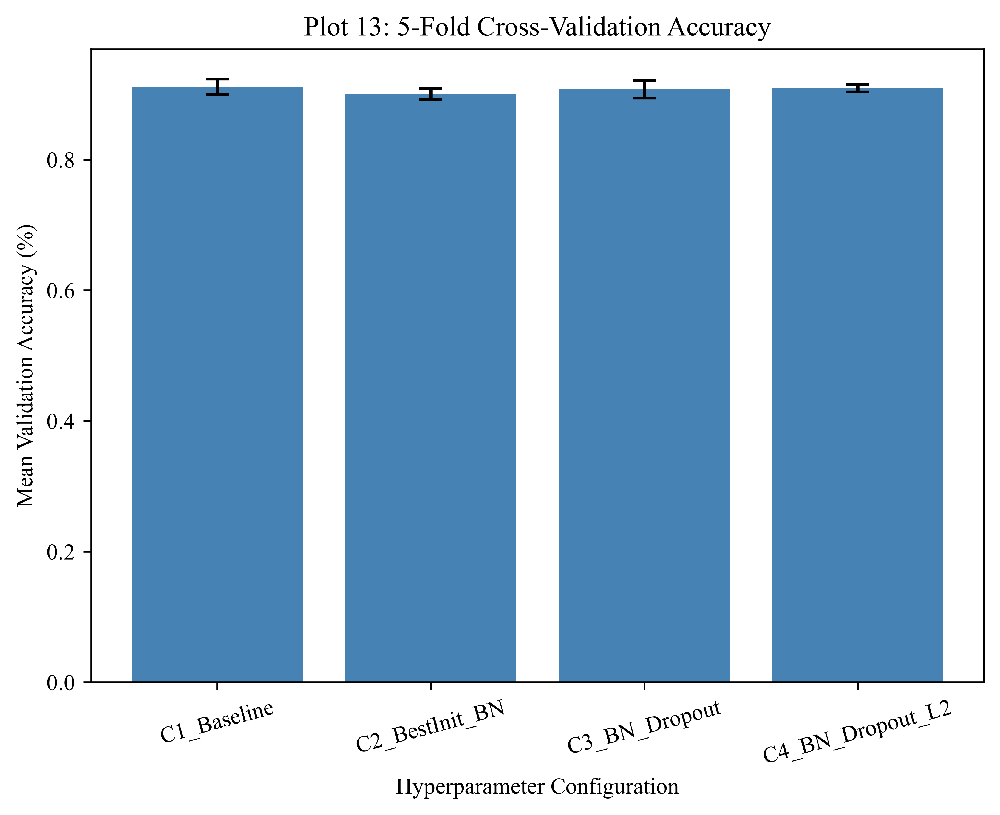

Selected best configuration: C1_Baseline


In [40]:
# Plot 13: 5-Fold Cross-Validation Accuracy with error bars
means = [np.mean(cv_results[name]) for name in candidate_configs]
stds = [np.std(cv_results[name]) for name in candidate_configs]

plt.figure(figsize=(7, 5))
plt.bar(list(candidate_configs.keys()), means, yerr=stds, capsize=5, color="steelblue")
plt.xlabel("Hyperparameter Configuration")
plt.ylabel("Mean Validation Accuracy (%)")
plt.title("Plot 13: 5-Fold Cross-Validation Accuracy")
plt.xticks(rotation=15)
save_plot("plot13_kfold_cv_accuracy")
plt.show()

# Inference: [Fill in after running] Select the config with the best
# combination of high mean accuracy AND low SD - the highest single mean is
# not automatically best if its variance across folds is high.

best_config_name = max(candidate_configs,
                        key=lambda n: (np.mean(cv_results[n]), -np.std(cv_results[n])))
print("Selected best configuration:", best_config_name)
best_cfg = candidate_configs[best_config_name]

In [41]:
final_model, final_history, final_train_time, test_acc = retrain_head_full_and_evaluate(
    best_cfg["build_kwargs"], best_cfg["optimizer_name"], best_cfg["opt_lr"])

y_pred = np.argmax(final_model.predict(test_feat, verbose=0), axis=1)
y_true = test_lbl

test_prec = precision_score(y_true, y_pred, average="macro", zero_division=0)
test_rec = recall_score(y_true, y_pred, average="macro", zero_division=0)
test_f1 = f1_score(y_true, y_pred, average="macro", zero_division=0)
# total deployed model size = frozen base params + trained head params
num_params = feature_extractor.count_params() + final_model.count_params()

final_report = {
    "Mean CV Accuracy": round(np.mean(cv_results[best_config_name]), 4),
    "CV Standard Deviation": round(np.std(cv_results[best_config_name]), 4),
    "Test Accuracy": round(test_acc, 4),
    "Precision": round(test_prec, 4),
    "Recall": round(test_rec, 4),
    "F1-score": round(test_f1, 4),
    "Training Time (s)": round(final_train_time, 3),
    "Number of Parameters": num_params,
}
print(pd.Series(final_report))

Mean CV Accuracy         9.113000e-01
CV Standard Deviation    1.170000e-02
Test Accuracy            8.986000e-01
Precision                9.032000e-01
Recall                   8.982000e-01
F1-score                 8.977000e-01
Training Time (s)        3.239000e+00
Number of Parameters     2.305381e+06
dtype: float64


saved plot14_confusion_matrix.eps


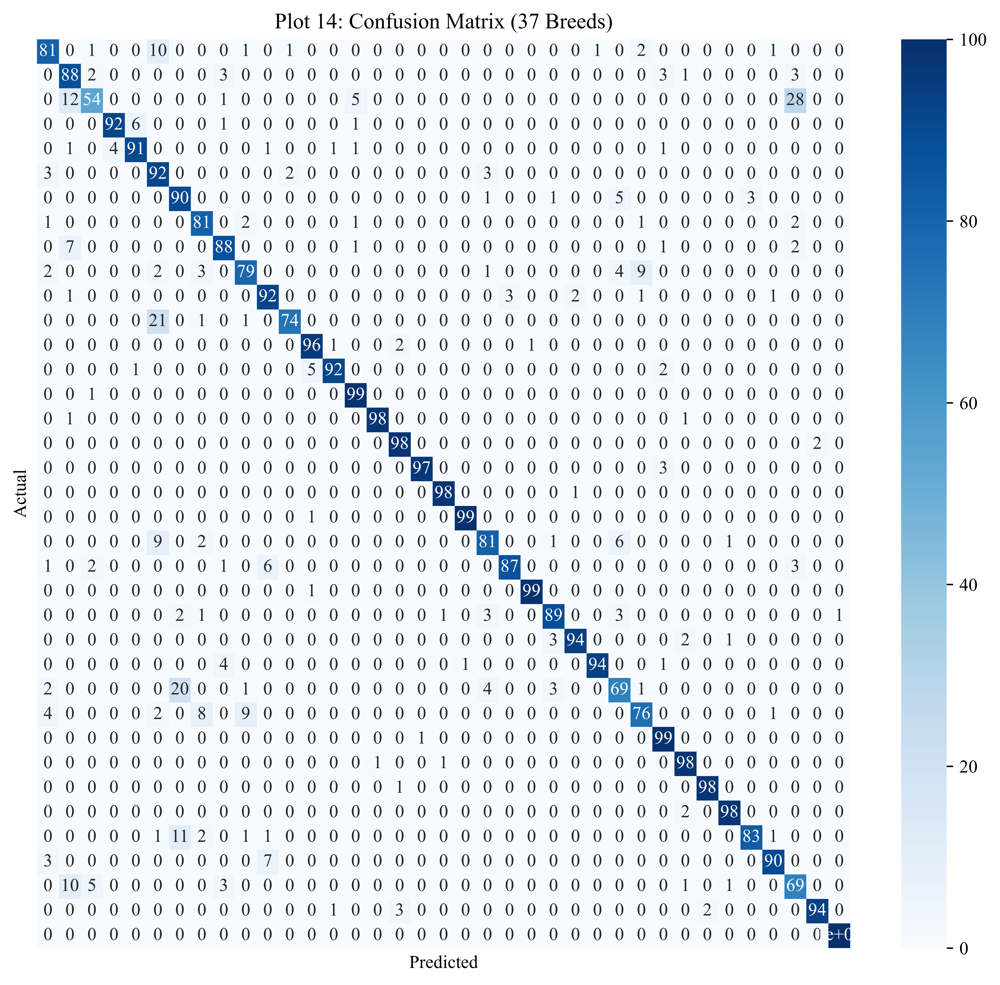

In [48]:
# Plot 14: Confusion Matrix
class_names = ds_info.features["label"].names
cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(10, 9))
sns.heatmap(cm, cmap="Blues", xticklabels=False, yticklabels=False,annot=True)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Plot 14: Confusion Matrix (37 Breeds)")
save_plot("plot14_confusion_matrix")
plt.show()

# Inference: [Fill in after running] Look at the diagonal for well-classified
# breeds, and the largest off-diagonal cells for the most commonly confused
# breed pairs - usually visually similar breeds.


saved plot15_misclassified_images.eps


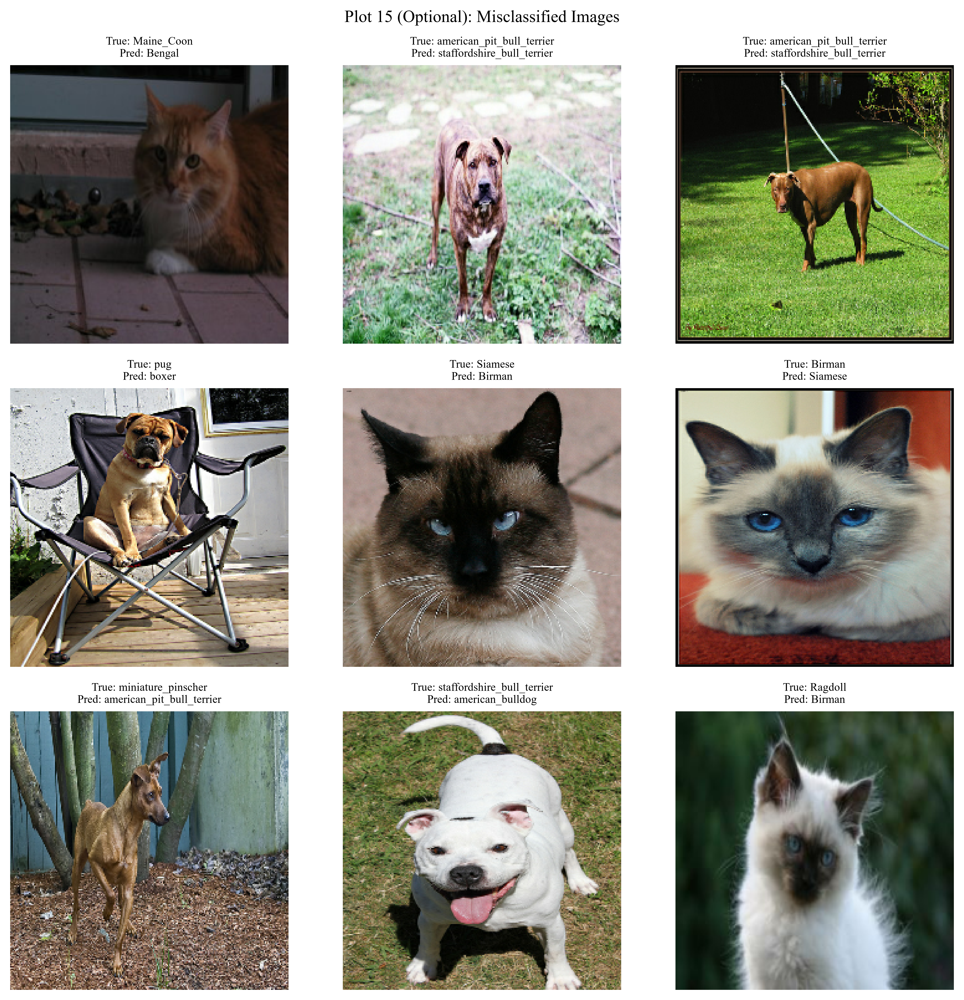

In [49]:
# Optional Plot 15: Misclassified Images
mis_idx = np.where(y_true != y_pred)[0][:9]

raw_test_images = []
for img, lbl in raw_test.take(len(y_true)):
    raw_test_images.append(tf.image.resize(img, (IMG_SIZE, IMG_SIZE)).numpy().astype("uint8"))

if len(mis_idx) > 0:
    plt.figure(figsize=(10, 10))
    for i, idx in enumerate(mis_idx):
        plt.subplot(3, 3, i + 1)
        plt.imshow(raw_test_images[idx])
        plt.title(f"True: {class_names[y_true[idx]]}\nPred: {class_names[y_pred[idx]]}",
                  fontsize=8)
        plt.axis("off")
    plt.suptitle("Plot 15 (Optional): Misclassified Images")
    plt.tight_layout()
    save_plot("plot15_misclassified_images")
    plt.show()
else:
    print("No misclassified samples found.")

# Inference: [Fill in after running] Misclassifications often occur between
# breeds with similar coat colour/pattern or body shape.


In [50]:
def best_name(histories_dict):
    return max(histories_dict, key=lambda n: max(histories_dict[n]["val_accuracy"]))


best_init_name = best_name(init_histories)
best_reg_name = best_name(reg_histories)
best_opt_name = best_name(opt_histories)

summary_configs = {
    "Baseline (No Reg, No BN)": dict(
        build_kwargs=dict(kernel_initializer="he_normal", use_batchnorm=False,
                           dropout_rate=0.0, l2_reg=0.0),
        optimizer_name="Adam", opt_lr=1e-3),
    f"Best Initialization ({best_init_name})": dict(
        build_kwargs=dict(kernel_initializer=init_strategies[best_init_name],
                           use_batchnorm=False, dropout_rate=0.0, l2_reg=0.0),
        optimizer_name="Adam", opt_lr=1e-3),
    f"Best Regularization ({best_reg_name})": dict(
        build_kwargs=dict(kernel_initializer="he_normal", **reg_configs[best_reg_name]),
        optimizer_name="Adam", opt_lr=1e-3),
    f"Best Optimizer ({best_opt_name})": dict(
        build_kwargs=dict(kernel_initializer="he_normal", use_batchnorm=True,
                           dropout_rate=0.0, l2_reg=0.0),
        optimizer_name=best_opt_name, opt_lr=1e-3),
    f"Best Hyperparameters - CV winner ({best_config_name})": candidate_configs[best_config_name],
}

summary_rows = []
for name, cfg in summary_configs.items():
    print(f"=== Full pipeline for: {name} ===")
    if name == f"Best Hyperparameters - CV winner ({best_config_name})":
        accs, elapsed, t_acc = cv_results[best_config_name], final_train_time, test_acc
    else:
        accs, _ = run_kfold_cv_head(name, cfg["build_kwargs"], cfg["optimizer_name"], cfg["opt_lr"])
        _, _, elapsed, t_acc = retrain_head_full_and_evaluate(
            cfg["build_kwargs"], cfg["optimizer_name"], cfg["opt_lr"])
    summary_rows.append({
        "Configuration": name,
        "CV Accuracy": round(np.mean(accs), 4),
        "SD": round(np.std(accs), 4),
        "Test Accuracy": round(t_acc, 4),
        "Training Time (s)": round(elapsed, 3),
    })

# Fine-Tuned Model row: reuse the real end-to-end Case-B run from Section 10
# instead of a full 5-fold CV over unfrozen-base training (see note above).
if FULL_CV_FOR_FINETUNE:
    ft_accs = []
    start = time.time()
    for fold_idx, (tr_idx, va_idx) in enumerate(kf.split(np.arange(n_train_total - n_val)), start=1):
        # Expensive path: real end-to-end fine-tuning per fold. Left as an
        # opt-in because it re-trains MobileNetV2 with an unfrozen base 5x.
        fold_train = train_raw.enumerate().filter(
            lambda i, xy: tf.reduce_any(tf.equal(i, tr_idx))).map(lambda i, xy: xy)
        fold_val = train_raw.enumerate().filter(
            lambda i, xy: tf.reduce_any(tf.equal(i, va_idx))).map(lambda i, xy: xy)
        m = build_full_model(kernel_initializer="he_normal", use_batchnorm=True,
                              dropout_rate=0.3, trainable_base=True, fine_tune_at=100)
        h, _ = train_full(m, optimizers.Adam(learning_rate=1e-5),
                           make_dataset(fold_train, shuffle=True),
                           make_dataset(fold_val, shuffle=False), epochs=EPOCHS_FT, verbose=0)
        ft_accs.append(max(h.history["val_accuracy"]))
    ft_cv_mean, ft_cv_sd, ft_elapsed = np.mean(ft_accs), np.std(ft_accs), time.time() - start
    ft_test_acc, _, _ = evaluate_full_on_test(model_ft)
else:
    ft_cv_mean = max(hist_ft.history["val_accuracy"])
    ft_cv_sd = float("nan")  # single split, not a true CV estimate
    ft_test_acc, _, _ = evaluate_full_on_test(model_ft)
    ft_elapsed = float("nan")  # not separately timed; see Section 10 timing

summary_rows.append({
    "Configuration": "Fine-Tuned Model",
    "CV Accuracy": round(ft_cv_mean, 4),
    "SD": ft_cv_sd if np.isnan(ft_cv_sd) else round(ft_cv_sd, 4),
    "Test Accuracy": round(ft_test_acc, 4),
    "Training Time (s)": ft_elapsed,
})

overall_results = pd.DataFrame(summary_rows)
print(overall_results.to_string(index=False))

# Final justification (fill in numbers from the table above): compare
# accuracy, CV standard deviation (reliability), test accuracy
# (generalization), and training time (computational cost) across rows, then
# justify the overall "winner" using all four criteria together.


=== Full pipeline for: Baseline (No Reg, No BN) ===
  [Baseline (No Reg, No BN)] Fold 1: val_accuracy = 0.8964
  [Baseline (No Reg, No BN)] Fold 2: val_accuracy = 0.9100
  [Baseline (No Reg, No BN)] Fold 3: val_accuracy = 0.9117
  [Baseline (No Reg, No BN)] Fold 4: val_accuracy = 0.9304
  [Baseline (No Reg, No BN)] Fold 5: val_accuracy = 0.9133
=== Full pipeline for: Best Initialization (Random) ===
  [Best Initialization (Random)] Fold 1: val_accuracy = 0.8913
  [Best Initialization (Random)] Fold 2: val_accuracy = 0.9100
  [Best Initialization (Random)] Fold 3: val_accuracy = 0.9270
  [Best Initialization (Random)] Fold 4: val_accuracy = 0.9151
  [Best Initialization (Random)] Fold 5: val_accuracy = 0.9014
=== Full pipeline for: Best Regularization (No Regularization) ===
  [Best Regularization (No Regularization)] Fold 1: val_accuracy = 0.8913
  [Best Regularization (No Regularization)] Fold 2: val_accuracy = 0.8998
  [Best Regularization (No Regularization)] Fold 3: val_accuracy = 

In [ ]:
# ## Section 15: Discussion Questions (answer in the report)
#
# 1. Model parameters (weights/biases, learned during training) vs
#    hyperparameters (learning rate, batch size, dropout rate, etc. - set
#    BEFORE training and not learned by gradient descent).
# 2. Weight initialization matters because it affects how gradients flow at
#    the start of training - a poor start can cause very slow convergence
#    or vanishing/exploding activations.
# 3. Zero initialization makes every neuron in a layer compute the exact
#    same output and receive the exact same gradient (symmetry problem), so
#    the network effectively behaves like a single neuron per layer.
# 4. Xavier/Glorot init scales weights based on fan-in + fan-out and works
#    best with tanh/sigmoid activations; He init scales based on fan-in
#    only (with a factor of 2) and is designed for ReLU-family activations.
# 5. If training accuracy keeps rising while validation accuracy plateaus or
#    drops (and/or validation loss starts increasing), that is a sign of
#    overfitting.
# 6. Dropout randomly deactivates a fraction of neurons each training step,
#    forcing the network to not rely on any single neuron/co-adapted group,
#    which acts like training an ensemble of sub-networks.
# 7. Batch Normalization stabilizes and speeds up training by normalizing
#    layer activations within each mini-batch, reducing internal covariate
#    shift.
# 8. See the worked example in Section 7 above (mean=5, variance=5,
#    normalized values approx [-1.342, -0.447, 0.447, 1.342]).
# 9. gamma and beta let the network learn to re-scale and re-shift the
#    normalized activations, so BN doesn't force every layer to strictly
#    zero-mean/unit-variance if that isn't optimal.
# 10. SGD is simple but can be slow/noisy; Momentum accelerates SGD along
#     consistent gradient directions and dampens oscillation; RMSProp
#     adapts the learning rate per parameter using a moving average of
#     squared gradients; Adam combines Momentum + RMSProp ideas (first and
#     second moment estimates) and usually converges fastest.
# 11. Too large a learning rate can cause the loss to oscillate, diverge, or
#     overshoot minima entirely.
# 12. Too small a learning rate makes training extremely slow and can get
#     stuck in flat regions/local minima.
# 13. Increasing batch size gives smoother/more stable gradient estimates
#     and faster epochs (better hardware utilization) but may need a larger
#     learning rate and can sometimes generalize slightly worse.
# 14. Stride is the step size the kernel moves across the input; padding
#     adds extra border pixels (usually zeros) so the output size can be
#     controlled and edge information isn't lost.
# 15. MobileNetV2 is efficient because it uses depthwise separable
#     convolutions (depthwise + pointwise) which drastically cut the number
#     of multiply-add operations compared to standard convolutions.
# 16. Depthwise separable convolution splits a standard convolution into a
#     depthwise convolution (one filter per input channel) followed by a
#     pointwise 1x1 convolution (combines channels), reducing computation.
# 17. Transfer learning reuses a model already trained on a large dataset
#     (e.g. ImageNet) as a starting point for a new, often smaller, task.
# 18. Feature extraction freezes the pretrained base and only trains a new
#     classifier head; fine-tuning additionally unfreezes some of the
#     pretrained layers and updates them (with a small learning rate).
# 19. A smaller learning rate is used in fine-tuning to avoid destroying the
#     already-useful pretrained weights with large, disruptive updates.
# 20. K-Fold CV gives a more reliable estimate of how a configuration
#     performs on unseen data by averaging over multiple train/val splits,
#     reducing the risk of picking a config that got "lucky" on one split.
# 21. The test set must stay untouched during tuning so that the final
#     reported performance is an unbiased estimate of real-world
#     generalization, not a number that has been indirectly overfit to.
# 22. Reporting mean AND standard deviation shows both typical performance
#     and how consistent/reliable that performance is across different data
#     splits.
# 23. No - a config with the single highest validation accuracy but high
#     variance/SD across folds may not be reliable; a slightly lower mean
#     with much lower SD (and lower cost) can be the better practical choice.

In [ ]:
# ## Section 16: Additional Exercise
# Extra1 (frozen base) uses cached-feature CV (cheap). Extra2 (partial
# unfreezing / fine-tuning) uses a single real end-to-end train/val/test
# evaluation rather than a full 5-fold CV, for the same computational-cost
# reason documented in Section 13 (flip FULL_CV_FOR_FINETUNE for a real CV).


In [51]:
extra1_cfg = dict(
    build_kwargs=dict(kernel_initializer="he_normal", use_batchnorm=True,
                       dropout_rate=0.4, l2_reg=1e-4),
    optimizer_name="Adam", opt_lr=5e-4, batch_size=16)

print("=== Cross-validating Extra1 (frozen base, cached features) ===")
extra1_accs, _ = run_kfold_cv_head("Extra1", extra1_cfg["build_kwargs"],
                                    extra1_cfg["optimizer_name"], extra1_cfg["opt_lr"],
                                    batch_size=extra1_cfg["batch_size"])
_, _, extra1_elapsed, extra1_test_acc = retrain_head_full_and_evaluate(
    extra1_cfg["build_kwargs"], extra1_cfg["optimizer_name"], extra1_cfg["opt_lr"],
    batch_size=extra1_cfg["batch_size"])

print("=== Training Extra2 (partial unfreeze / fine-tuning, single split) ===")
model_extra2 = build_full_model(kernel_initializer="glorot_uniform", use_batchnorm=True,
                                 dropout_rate=0.2, l2_reg=0.0, trainable_base=True,
                                 fine_tune_at=100)
hist_extra2, extra2_elapsed = train_full(
    model_extra2, optimizers.Adam(learning_rate=1e-4),
    make_dataset(train_raw, shuffle=True, batch_size=64),
    make_dataset(val_raw, shuffle=False, batch_size=64), epochs=EPOCHS_FT, verbose=0)
extra2_test_acc, _, _ = evaluate_full_on_test(model_extra2)


=== Cross-validating Extra1 (frozen base, cached features) ===
  [Extra1] Fold 1: val_accuracy = 0.8879
  [Extra1] Fold 2: val_accuracy = 0.8846
  [Extra1] Fold 3: val_accuracy = 0.9151
  [Extra1] Fold 4: val_accuracy = 0.9066
  [Extra1] Fold 5: val_accuracy = 0.9048
=== Training Extra2 (partial unfreeze / fine-tuning, single split) ===


c:\Users\Kishore\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\epoch_iterator.py:74: UserWarning: `shuffle=True` was passed, but will be ignored since the data `x` was provided as a tf.data.Dataset. The Dataset is expected to already be shuffled (via `.shuffle(buffer_size)`).
  self.data_adapter = data_adapters.get_data_adapter(


In [52]:
extra_summary_rows = [
    {"Configuration": "Extra1_Frozen_LR5e4_D0.4_BS16",
     "CV Mean": round(np.mean(extra1_accs), 4), "CV SD": round(np.std(extra1_accs), 4),
     "Test Accuracy": round(extra1_test_acc, 4), "Training Time (s)": round(extra1_elapsed, 3)},
    {"Configuration": "Extra2_PartialUnfreeze_LR1e4_D0.2_BS64 (single split)",
     "CV Mean": round(max(hist_extra2.history["val_accuracy"]), 4), "CV SD": float("nan"),
     "Test Accuracy": round(extra2_test_acc, 4), "Training Time (s)": round(extra2_elapsed, 2)},
    {"Configuration": f"{best_config_name} (selected in Section 11)",
     "CV Mean": round(np.mean(cv_results[best_config_name]), 4),
     "CV SD": round(np.std(cv_results[best_config_name]), 4),
     "Test Accuracy": round(test_acc, 4), "Training Time (s)": round(final_train_time, 3)},
]

extra_df = pd.DataFrame(extra_summary_rows)
print(extra_df.to_string(index=False))

# Students: using the table above, justify whether Extra1 or Extra2 is
# preferable to best_config_name based on (a) mean CV/val accuracy, (b)
# reliability (SD, where available), (c) computational cost (training
# time - note Extra2's cost is far higher due to backprop through unfrozen
# conv layers), and (d) final test-set performance.

                                        Configuration  CV Mean  CV SD  Test Accuracy  Training Time (s)
                        Extra1_Frozen_LR5e4_D0.4_BS16   0.8998 0.0117         0.8896             10.991
Extra2_PartialUnfreeze_LR1e4_D0.2_BS64 (single split)   0.9497    NaN         0.8498            351.150
                 C1_Baseline (selected in Section 11)   0.9113 0.0117         0.8986              3.239
